# Exploratory Data Analysis

## Section 1: Loading the data

### Import the relevant libraries and load the dataset

In [1]:
# Import the required libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the dataset
data_path = 'ai4i2020.csv'
df = pd.read_csv(data_path)

# Display the first few rows of the dataset to understand its structure
df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


### Preliminary data quality checks

In [2]:
# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

# Check for duplicates
print("\nNumber of duplicate rows:", df.duplicated().sum())

# Basic descriptive statistics to identify potential outliers
print("\nDescriptive statistics:")
print(df.describe())

Missing values per column:
UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64

Number of duplicate rows: 0

Descriptive statistics:
               UDI  Air temperature [K]  Process temperature [K]  \
count  10000.00000         10000.000000             10000.000000   
mean    5000.50000           300.004930               310.005560   
std     2886.89568             2.000259                 1.483734   
min        1.00000           295.300000               305.700000   
25%     2500.75000           298.300000               308.800000   
50%     5000.50000           300.100000               310.100000   
75%     7500.25000      

## Section 2: Begin basic data analysis

### Visualise the pairwise relationships between each factor

C:\Users\wongd\anaconda3\envs\NTU\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


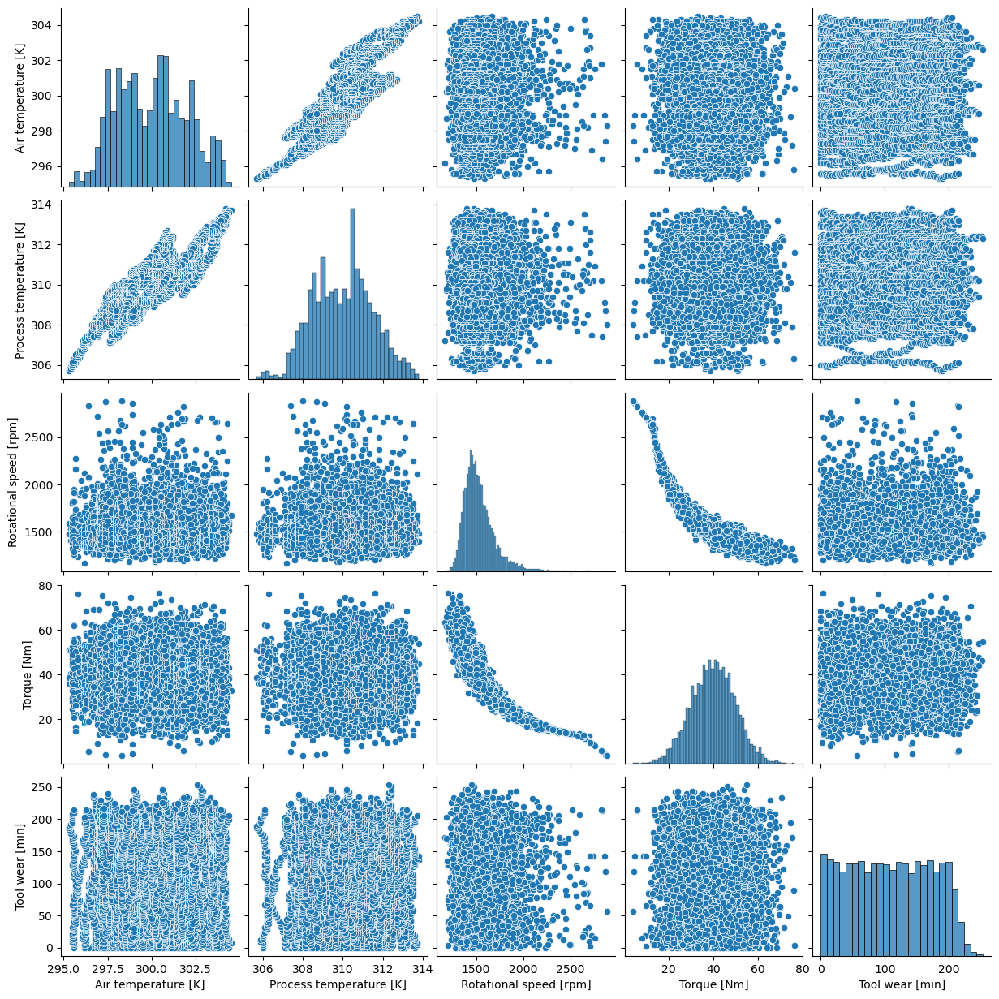

In [3]:
# Select a subset of columns if the dataset is very large
columns_to_plot = ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']
sns.pairplot(df[columns_to_plot])
plt.show()

### Begin analysis for the different failures

In [4]:
# Summarizing the total number of instances for each failure mode and non-failures
failure_modes_summary = df[['Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']].sum().reset_index()
failure_modes_summary.columns = ['Type', 'Count']

# Display the summary
failure_modes_summary

,Type,Count
0,Machine failure,339
1,TWF,46
2,HDF,115
3,PWF,95
4,OSF,98
5,RNF,19


### Visualise the factors in histograms to understand the spread

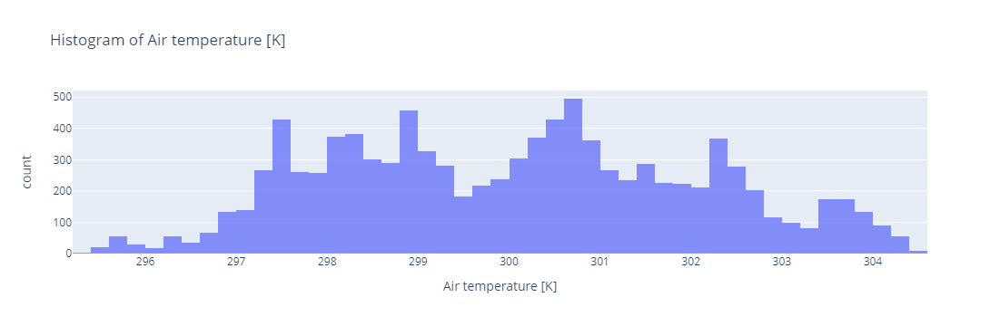

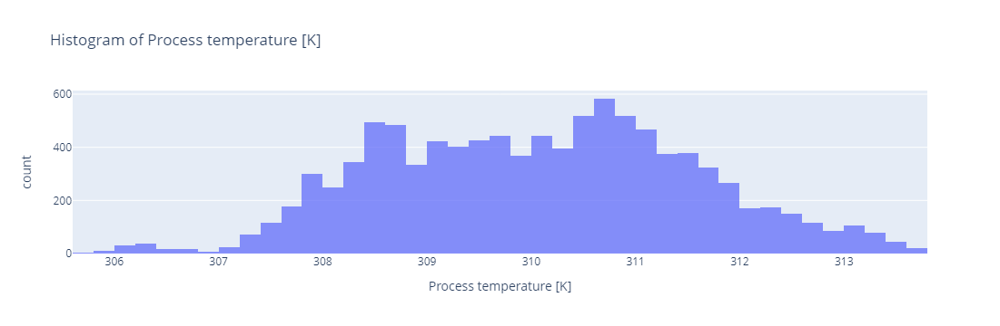

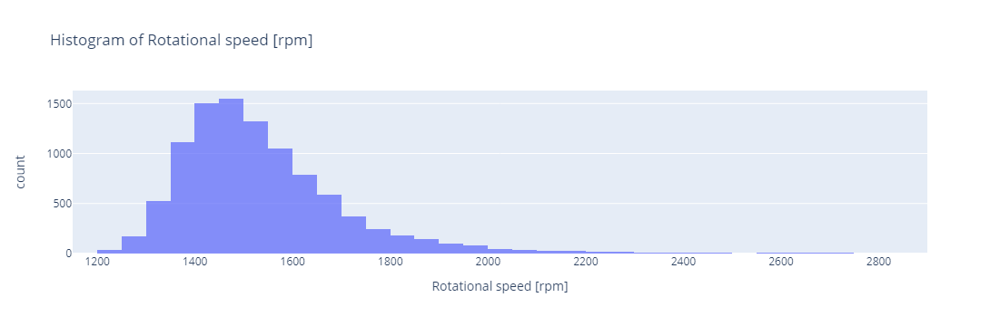

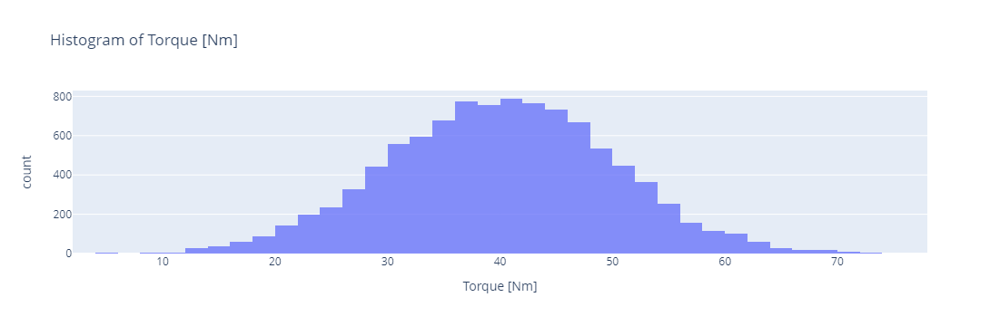

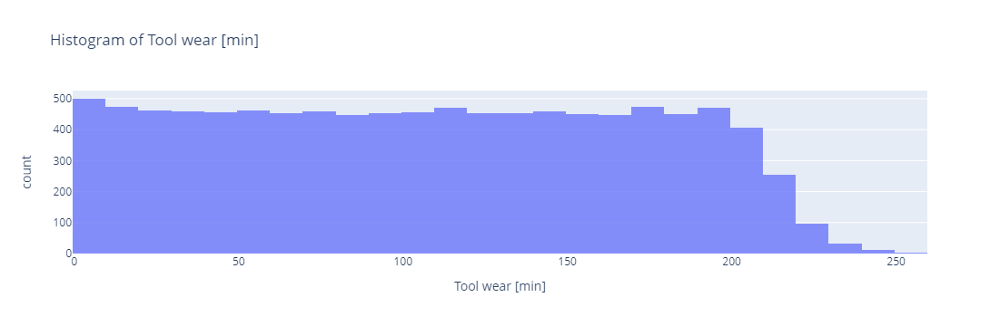

In [5]:
# List of factors you're interested in visualizing
factors = ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']

# Creating histograms for each factor
for factor in factors:
    fig = px.histogram(df, x=factor,
                       title=f"Histogram of {factor}",
                       nbins=50, # Adjust the number of bins for better visualization
                       opacity=0.75) # Adjust opacity to see the distribution clearly
    fig.show()

### Visualise the % of failure of each mode, however, keeping in mind that some machine failures constitute mulitple modes of failures

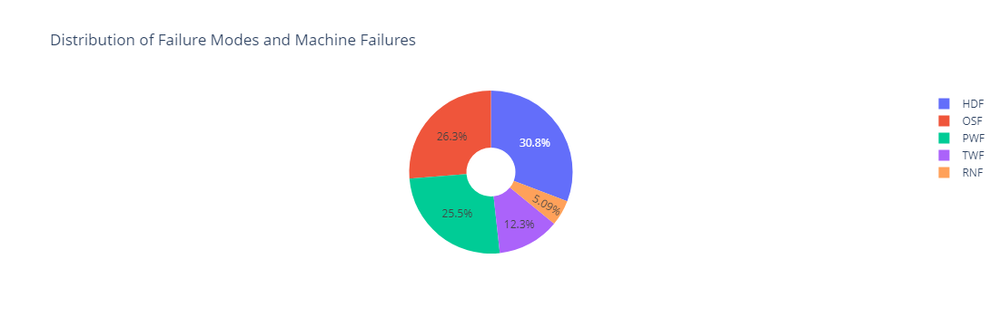

In [6]:
# Prepare data for the pie chart
failure_modes = df[['TWF', 'HDF', 'PWF', 'OSF', 'RNF']].sum().reset_index()
failure_modes.columns = ['Type', 'Count']
labels = failure_modes['Type']
values = failure_modes['Count']

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(title_text="Distribution of Failure Modes and Machine Failures")

# Show the figure
fig.show()

### Plot some barplots

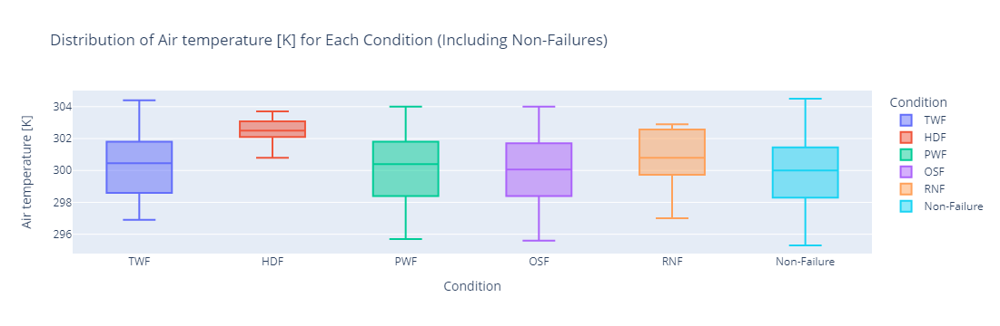

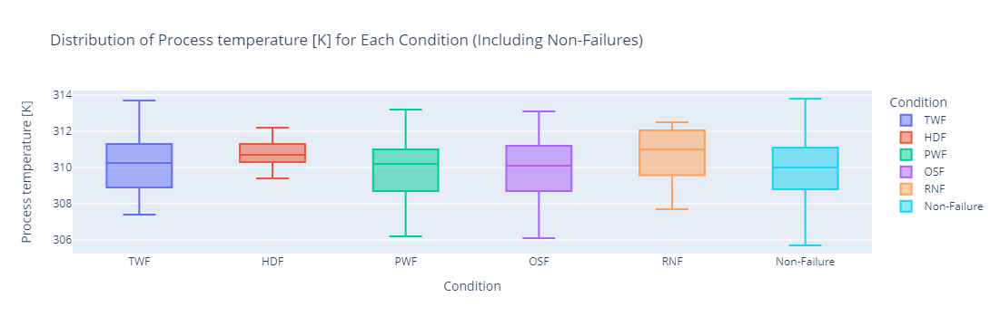

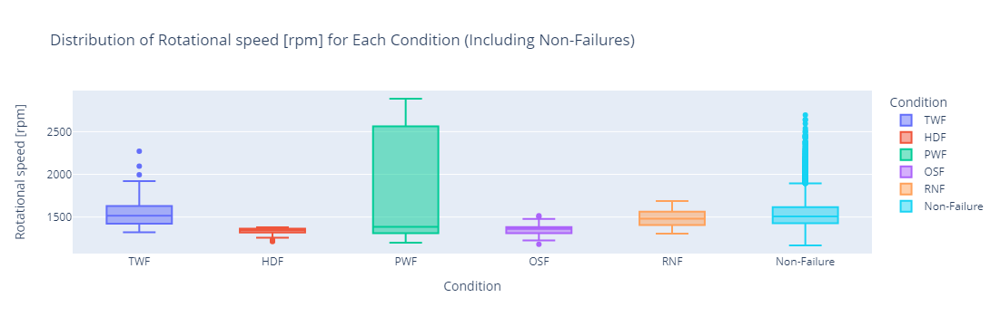

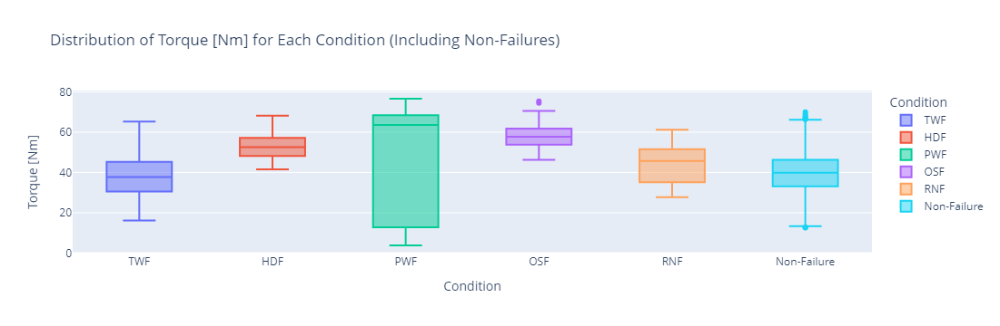

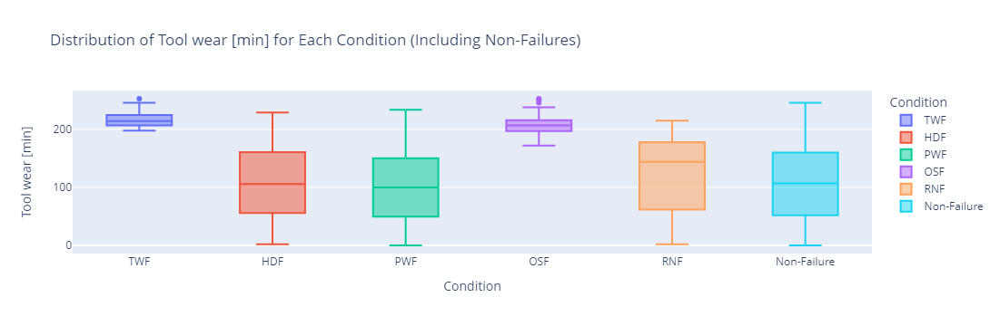

In [7]:
# Filter the data for instances where any specific type of failure occurred
failure_data = df[df[['TWF', 'HDF', 'PWF', 'OSF', 'RNF']].any(axis=1)]

# Melt the dataframe to have a long format suitable for plotting with Plotly Express
melted_failure_data = failure_data.melt(id_vars=['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 
                                                 'Torque [Nm]', 'Tool wear [min]'], 
                                        value_vars=['TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
                                        var_name='Failure Type', value_name='Failure Occurred')

# Filter out the rows where failure did not occur
melted_failure_data = melted_failure_data[melted_failure_data['Failure Occurred'] == 1]
no_failure_data = melted_failure_data[melted_failure_data['Failure Occurred'] == 0]


# Add a 'Non-Failure' column to represent non-failure instances
df['Non-Failure'] = (df[['TWF', 'HDF', 'PWF', 'OSF', 'RNF']].sum(axis=1) == 0).astype(int)

# Melt the dataframe to include both failure and non-failure instances
melted_data_all = df.melt(id_vars=['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 
                                   'Torque [Nm]', 'Tool wear [min]'], 
                          value_vars=['TWF', 'HDF', 'PWF', 'OSF', 'RNF', 'Non-Failure'],
                          var_name='Condition', value_name='Occurred').query('Occurred == 1')

# Create box plots for each factor, comparing across different conditions (including non-failures)
for factor in ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']:
    fig = px.box(melted_data_all, x='Condition', y=factor, 
                 title=f'Distribution of {factor} for Each Condition (Including Non-Failures)',
                 color='Condition')
    fig.show()


### Visualise where the failures often occur with respect to the histograms

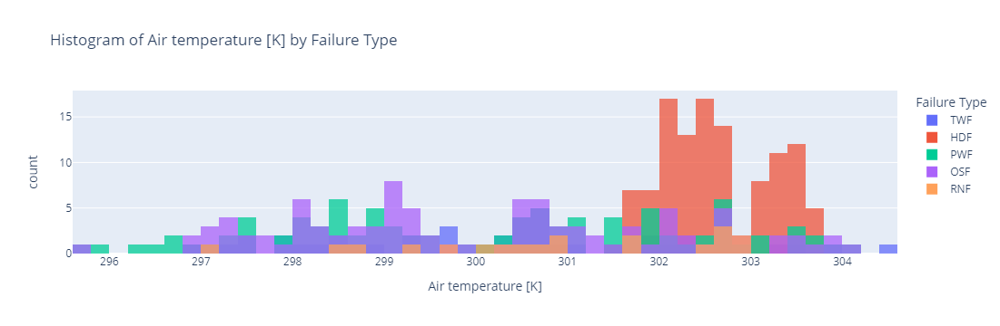

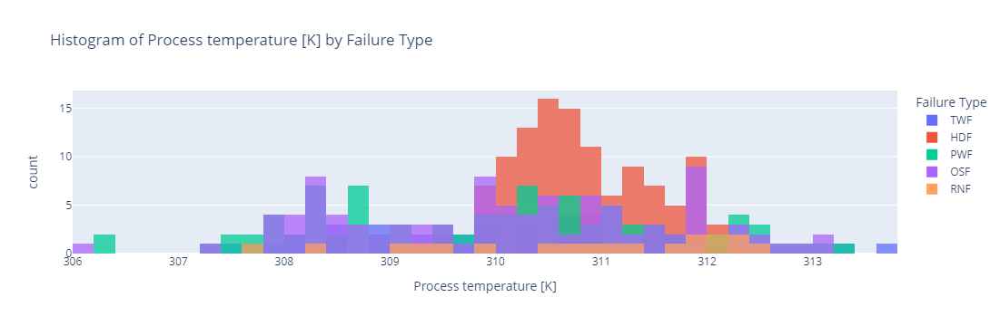

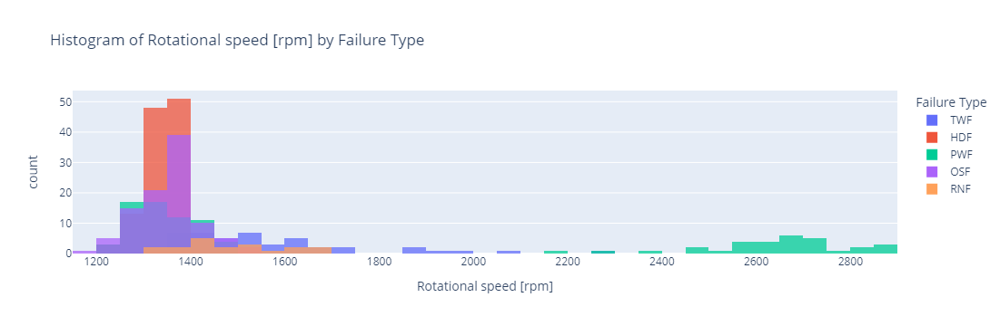

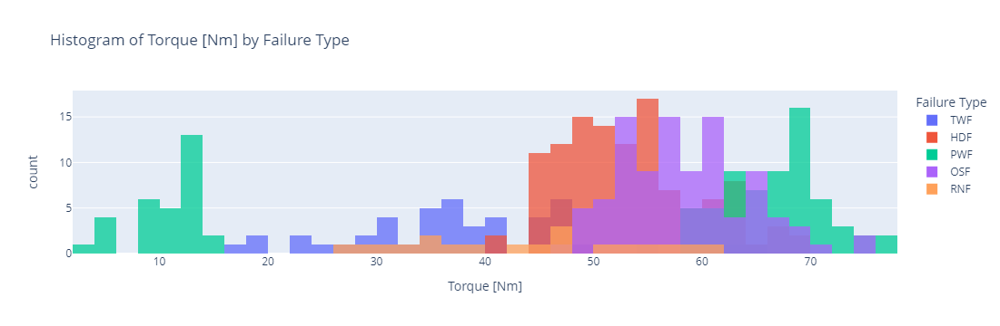

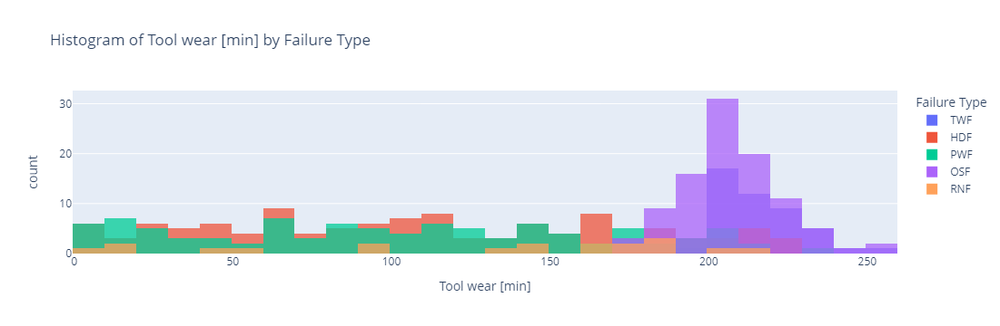

In [8]:
factors = ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']

# Creating histograms for each factor, broken down by failure type
for factor in factors:
    fig = px.histogram(melted_failure_data, x=factor, color="Failure Type",
                       title=f"Histogram of {factor} by Failure Type",
                       labels={"Failure Type": "Failure Type"},
                       barmode="overlay", # Overlay the histograms for comparison
                       nbins=50, # Adjust the number of bins for better visualization
                       opacity=0.75) # Adjust opacity to see overlapping bars
    fig.show()

### Plot a correlation matrix to visualise the relationship between each factor

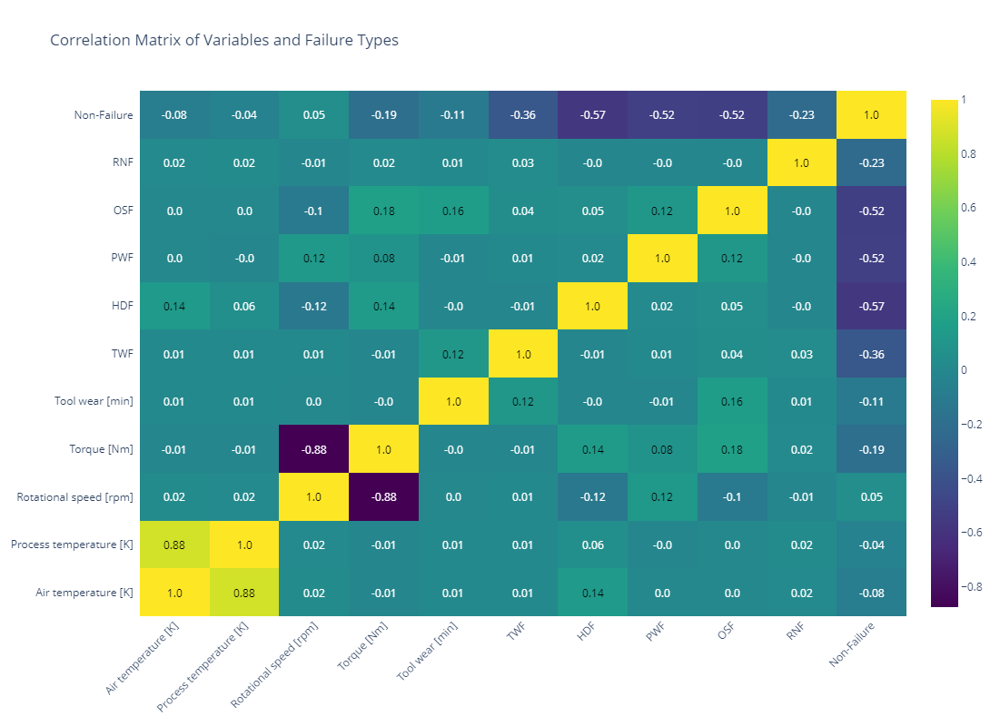

In [9]:
cleaned_df = df.drop(columns =['UDI','Product ID', 'Type', 'Machine failure'])

# Calculating the correlation matrix
correlation_matrix = cleaned_df.corr()

# Visualizing the correlation matrix using Plotly
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns.tolist(),
    y=correlation_matrix.index.tolist(),
    colorscale='Viridis',
    annotation_text=correlation_matrix.round(2).values,
    showscale=True
)

fig.update_layout(title='Correlation Matrix of Variables and Failure Types',
                  xaxis=dict(tickangle=-45, side='bottom'),
                  yaxis=dict(tickmode='array', tickvals=list(range(len(correlation_matrix.index)))),
                  width=800, height=800)

fig.show()



### Perform PCA (for fun)

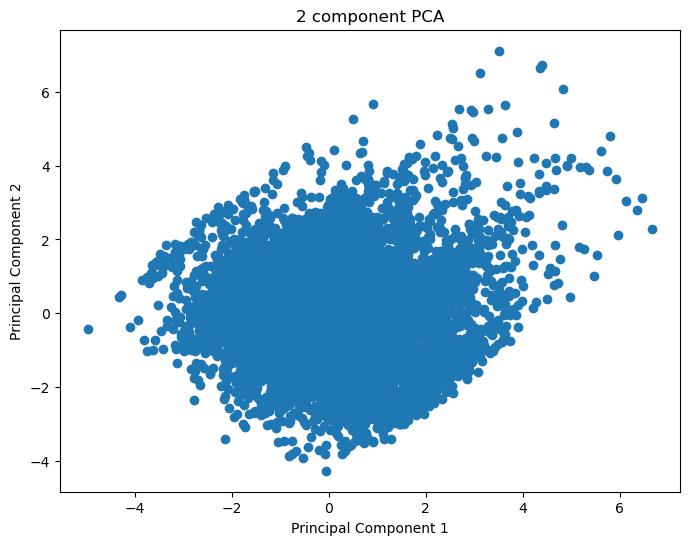

Explained variance ratio: [0.3821481  0.36817048]


In [10]:
# Selecting numerical features for PCA
features = ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']
x = df.loc[:, features].values

# Standardizing the features
x = StandardScaler().fit_transform(x)

# Performing PCA
pca = PCA(n_components=2)  # Reducing to 2 dimensions as an example
principalComponents = pca.fit_transform(x)

# Creating a DataFrame with principal component values
principalDf = pd.DataFrame(data = principalComponents, columns = ['Principal Component 1', 'Principal Component 2'])

# Visualizing the PCA results
plt.figure(figsize=(8,6))
plt.scatter(principalDf['Principal Component 1'], principalDf['Principal Component 2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2 component PCA')
plt.show()

# Explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)

## Plots for visualising data

In [11]:
# Plot some interesting tables
df_additional_features = df.drop(["UDI", "Product ID"], axis=1) 

# Create some additional features via data engineering accordingly to the AI4I description
df_additional_features['Temperature difference [K]']= df_additional_features['Process temperature [K]'] - df_additional_features['Air temperature [K]']
# This value of 0.10471955 is 2*pi/60, which converts rpm into a distance value in meters per second
df_additional_features['Power [W]'] = df_additional_features['Torque [Nm]'] * df_additional_features['Rotational speed [rpm]'] * 0.104719755
df_additional_features['Strain [minNm]'] = df_additional_features['Torque [Nm]'] * df_additional_features['Tool wear [min]']

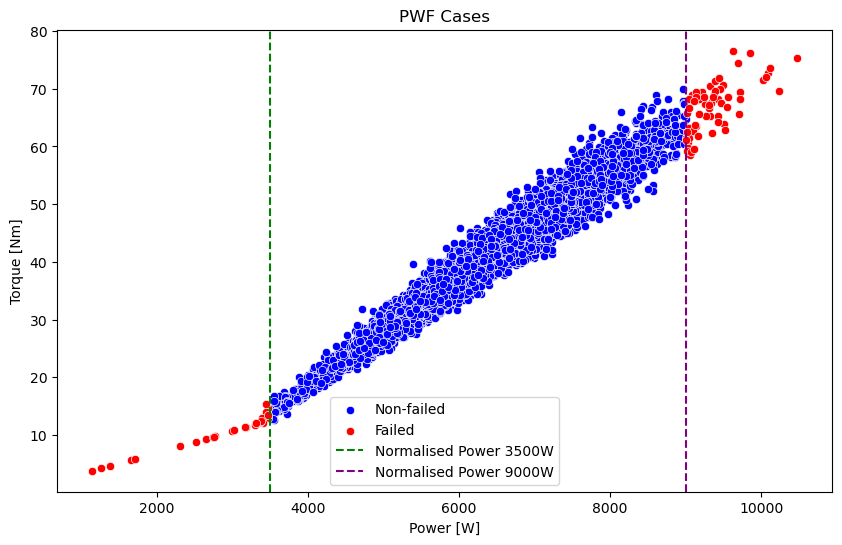

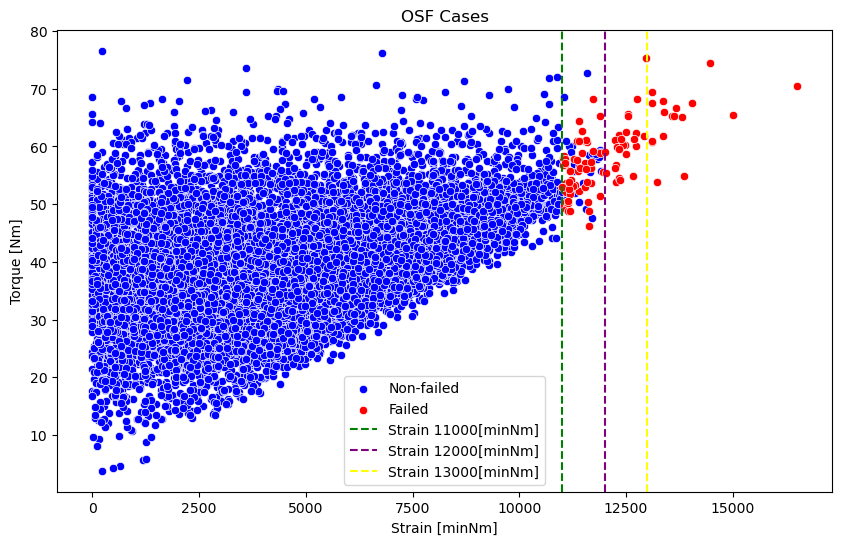

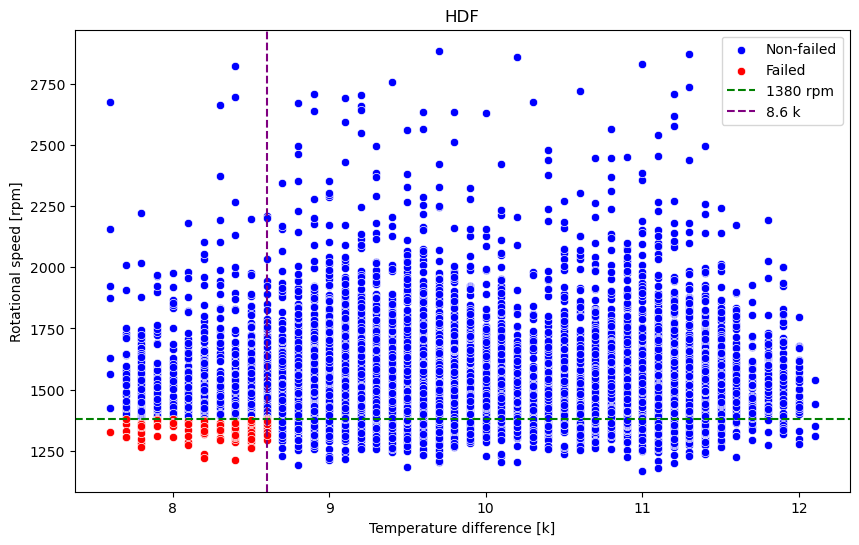

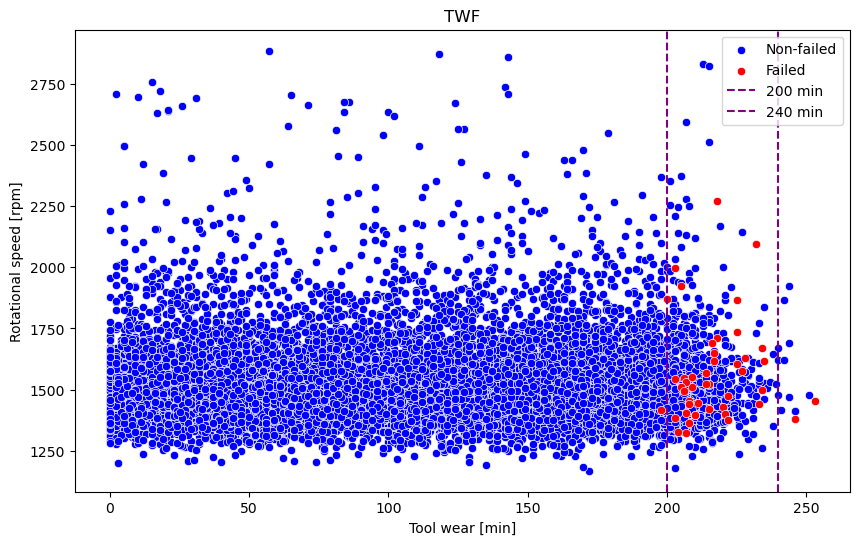

In [12]:
plt.figure(figsize=(10, 6))

# Plot the data points where red indicates failure and blue means no failure
sns.scatterplot(data=df_additional_features[df_additional_features['PWF'] == 0], x='Power [W]', y='Torque [Nm]', color='blue', label='Non-failed')
sns.scatterplot(data=df_additional_features[df_additional_features['PWF'] == 1], x='Power [W]', y='Torque [Nm]', color='red', label='Failed')
# Add threshold lines from the Kaggle description
plt.axvline(3500, color='green', linestyle='--', label='Normalised Power 3500W')
plt.axvline(9000, color='purple', linestyle='--', label='Normalised Power 9000W')
plt.xlabel('Power [W]')
plt.ylabel('Torque [Nm]')
plt.title('PWF Cases')
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_additional_features[df_additional_features['OSF'] == 0], x='Strain [minNm]', y='Torque [Nm]', color='blue', label='Non-failed')
sns.scatterplot(data=df_additional_features[df_additional_features['OSF'] == 1], x='Strain [minNm]', y='Torque [Nm]', color='red', label='Failed')
# Three different lines for L,M,H
plt.axvline(11000, color='green', linestyle='--', label='Strain 11000[minNm]')
plt.axvline(12000, color='purple', linestyle='--', label='Strain 12000[minNm]')
plt.axvline(13000, color='yellow', linestyle='--', label='Strain 13000[minNm]')
plt.xlabel('Strain [minNm]')
plt.ylabel('Torque [Nm]')
plt.title('OSF Cases')
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_additional_features[df_additional_features['HDF'] == 0], x='Temperature difference [K]', y='Rotational speed [rpm]', color='blue', label='Non-failed')
sns.scatterplot(data=df_additional_features[df_additional_features['HDF'] == 1], x='Temperature difference [K]', y='Rotational speed [rpm]', color='red', label='Failed')
# Separation threshold lines for both conditions
plt.axhline(1380, color='green', linestyle='--', label='1380 rpm')
plt.axvline(8.6, color='purple', linestyle='--', label='8.6 k')
plt.xlabel('Temperature difference [k]')
plt.ylabel('Rotational speed [rpm]')
plt.title('HDF')
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_additional_features[df_additional_features['TWF'] == 0], x='Tool wear [min]', y='Rotational speed [rpm]', color='blue', label='Non-failed')
sns.scatterplot(data=df_additional_features[df_additional_features['TWF'] == 1], x='Tool wear [min]', y='Rotational speed [rpm]', color='red', label='Failed')
plt.axvline(200, color='purple', linestyle='--', label='200 min')
plt.axvline(240, color='purple', linestyle='--', label='240 min')
plt.xlabel('Tool wear [min]')
plt.ylabel('Rotational speed [rpm]')
plt.title('TWF')
plt.legend()
plt.show()

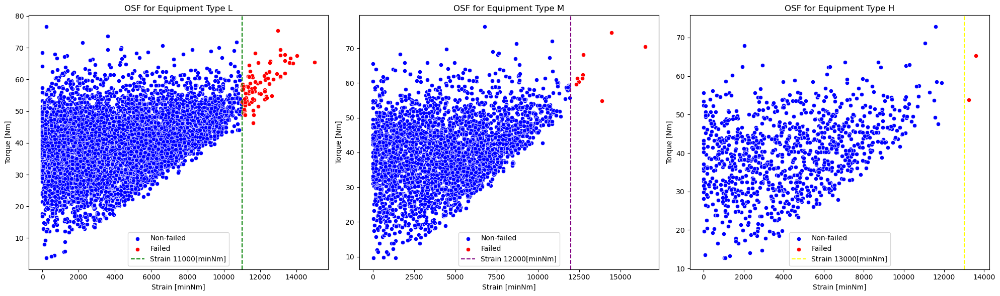

In [13]:
# Since OSF has 3 different types, L,M,H: we need to explore more
# Define the different types of equipment to plot
types = ["L", "M", "H"]
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot each type separately
for i, equipment_type in enumerate(types):
    filtered_data = df_additional_features[df_additional_features['Type'] == equipment_type] # Filter the data based on the current equipment type
    sns.scatterplot(data=filtered_data[filtered_data['OSF'] == 0], x='Strain [minNm]', y='Torque [Nm]', color='blue', label='Non-failed', ax=axes[i]) # Plot data points for non-failed machines of the current equipment type using blue color
    sns.scatterplot(data=filtered_data[filtered_data['OSF'] == 1], x='Strain [minNm]', y='Torque [Nm]', color='red', label='Failed', ax=axes[i]) # Plot data points for failed machines of the current equipment type using red color

    if (equipment_type == "L"):
        axes[i].axvline(11000, color='green', linestyle='--', label='Strain 11000[minNm]')
    elif (equipment_type == "M"):
        axes[i].axvline(12000, color='purple', linestyle='--', label='Strain 12000[minNm]')
    else:
        axes[i].axvline(13000, color='yellow', linestyle='--', label='Strain 13000[minNm]')
    
    # Set x and y labels for each subplot
    axes[i].set_xlabel('Strain [minNm]')
    axes[i].set_ylabel('Torque [Nm]')
    axes[i].set_title(f'OSF for Equipment Type {equipment_type}') # Set a title for each subplot based on the equipment type

    axes[i].legend() # Add a legend to each subplot

plt.tight_layout() # Adjust the layout to ensure plots do not overlap
plt.show()

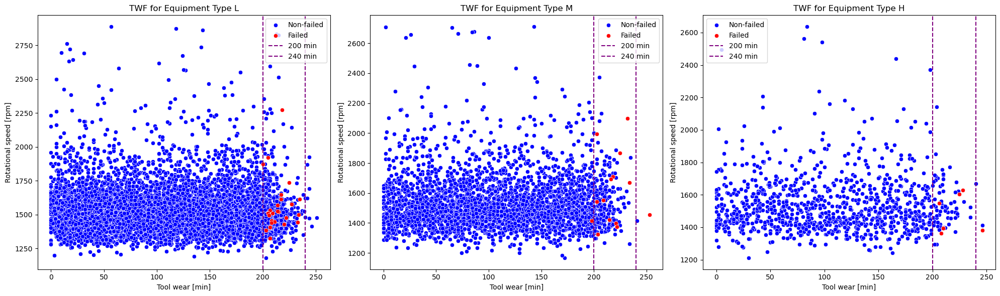

In [14]:
# Diving more into TWF mode of failure, looking into TWF mode of failure for each type of machines (L, M and H):

types = ["L", "M", "H"]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for i, equipment_type in enumerate(types):
    filtered_data = df_additional_features[df_additional_features['Type'] == equipment_type]
    sns.scatterplot(data=filtered_data[filtered_data['TWF'] == 0], x='Tool wear [min]', y='Rotational speed [rpm]', color='blue', label='Non-failed', ax=axes[i])
    sns.scatterplot(data=filtered_data[filtered_data['TWF'] == 1], x='Tool wear [min]', y='Rotational speed [rpm]', color='red', label='Failed', ax=axes[i])
    
    axes[i].axvline(200, color='purple', linestyle='--', label='200 min')
    axes[i].axvline(240, color='purple', linestyle='--', label='240 min')

    axes[i].set_xlabel('Tool wear [min]')
    axes[i].set_ylabel('Rotational speed [rpm]')
    axes[i].set_title(f'TWF for Equipment Type {equipment_type}')
    axes[i].legend()

plt.tight_layout()
plt.show()

In [15]:
df_additional_features.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,Non-Failure,Temperature difference [K],Power [W],Strain [minNm]
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,1,10.5,6951.590552,0.0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,1,10.5,6826.722716,138.9
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,1,10.4,7749.387534,247.0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,1,10.4,5927.504652,276.5
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,1,10.5,5897.816602,360.0


In [16]:
df_additional_features.to_csv("Data_Processing_Cleaned_CSV.csv", index=False)